# World Data League 2023

## Team: CalmCod3rs
## 👥 Authors
- Ana Luiza Kaori Akiyama
- Guilherme Caixeta
- Luiz Gustavo Moniz




###  **Table of Contents**

###  1 -[Introduction](#first-bullet)

###  2 -[Data Preparation](#second-bullet)

###  3 -[Exploratory Data Analysis (EDA)](#third-bullet)

###  4 -[Forecasting Model](#fourth-bullet)

###  5 -[Determining Species Iteration](#fifth-bullet)

###  6 -[Conclusion](#sixth-bullet)

###  7 -[References](#seventh-bullet)

###  8 -[Appendix 1: Main Functions](#eithth-bullet)

## 🎯 Challenge
Avencas Marine Protected Area: Predict the Future of the Local Ecosystem and its Species


##  1 - <span style="color:blue">Introduction</span>  <a class="anchor" id="first-bullet"></a>

Marine biodiversity is under threat from various human activities, such as overfishing, pollution, climate change, and habitat degradation. Understanding the trends and drivers of marine biodiversity is crucial for developing effective conservation and management strategies.

In this project, we aim to understand the changes in maritime species in rocky shore area of Avencas, a coastal area in Cascais, Portugal, using a timeseries dataset (from Nov 2011 to Nov 2020) provided by Cascais Municipality. We'll also explore other types of datasets available on the web, in search of new explanatory variables.

We will use machine learning techniques to explore the relationships between the response and predictor variables and select the best model based on its performance and interpretability. 

Finally, a more detailed study of the behavior of the species over the period will be carried out. At the end of the study, a product will be proposed that aims to assist the municipality both in data collection and in providing new insights.

### Data Extraction (Find relevant data sources)

We are going to analyze 5 dataset files:

1- **AMPA_Data_Sample** (xlsx format) with 3 tabs:
- Sessil (% Coverage): Occurence of a list of sessile species in the AMPA area (Nov 2011 - Nov 2020)
- Mobil (nº individuals): Occurence of a list of mobile species in the AMPA area (Nov 2011 - Nov 2020)
- Invasive_conservat species list: Information about invasiveness and conservation status of individual species. 2 Datasets: one for sessil, one for mobile species.


2- **Meteorology of Cascais**: Information about daily precipitation and Daily average wind speed (Nov 2013 - Nov 2020)

3- **OceanSODA-ETHZ**: A global gridded dataset of the surface ocean carbonate system for seasonal to decadal studies of ocean acidification

4- **Daily Fishing Effort** at 10th Degree Resolution by MMSI, version 2.0, 2012-2020: Fishing effort and vessel presence is binned into grid cells, and measured in units of hours.

5- **Sampling study area** (shapefile): Four sampling sections (A, B, D, E), which were stratiﬁed in supratidal and middle-intertidal areas. Sections B and D were located inside the Biophysical Interest Zone (ZIBA), while sections A and E were located outside the ZIBA.


### Load libraries

In [31]:
import os
import io
import PIL
import cv2
import json
import shap
import glob
#import pygeoda
import logging
import warnings
import matplotlib
#import hvplot.dask
import numpy as np
import pandas as pd
import hvplot.pandas
import seaborn as sns
import catboost as cb
import geopandas as gpd
import contextily as ctx
import plotly.express as px
#import dask.dataframe as dd

In [193]:
from pysal.model import spreg
from matplotlib import gridspec
from pyvis.network import Network
from IPython.display import IFrame
from shapely.geometry import shape
from matplotlib import pyplot as plt
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
from dask.diagnostics import ProgressBar
from IPython.display import Image, display
from catboost import CatBoostRegressor, Pool
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.preprocessing import StandardScaler, RobustScaler
from mlxtend.frequent_patterns import apriori, association_rules

In [33]:
warnings.filterwarnings("ignore", category=matplotlib.MatplotlibDeprecationWarning)
logging.getLogger("prophet").setLevel(logging.WARNING)
logging.getLogger("cmdstanpy").disabled = True
warnings.filterwarnings("ignore")
hvplot.extension("bokeh")

In [34]:
%config Completer.use_jedi = False
%load_ext holoviews.ipython
%matplotlib inline

The holoviews.ipython extension is already loaded. To reload it, use:
  %reload_ext holoviews.ipython


## 💻 Development


##  2 - <span style="color:blue">Data Preparation</span>  <a class="anchor" id="second-bullet"></a>
- Load and Understand the data  
- Identify necessary preparation steps
- Clean the data
- Handle outliers

### Load and Understand the Dataset

Dataframe: mobil / sessil

Columns description:

Index:

- **Date** - Datetime (frequency: monthly)
- **Zone** - Sampling sections (A, B, D, E, F). Sections B and D were located inside the ZIBA, while sections A, E and F were located outside the ZIBA.
- **Supratidal/Middle Intertidal** - Sampling sections were stratiﬁed in supratidal and middle-intertidal areas

Main Features:
- **Water temperature** - Water temperature in degree celcius
- **Weather Condition** - Weather Condition description
- **Tide** - The measure in meters of the low tide

Target:
- **TOTAL_VALUE** - total number of individuals of all study species in the sample

The mobil dataframe contains 57 columns that refers to individuals of mobile species studied. 

In [259]:
sessil, mobil, invasive_conservat = load_dataset("Municipality")

Dataframe: metereology_features

Columns description:

Index:

- **Date** - Datetime (frequency: daily)

Main Features:

- **precipitation**: water that falls from the clouds towards the ground (mm)

- **wind**:  wind speed (m/s)

In [260]:
metereology_features = load_dataset("Metereology")

Dataframe: ocean_features


Columns description:

Index:

- **Date** - Datetime (frequency: monthly)

Main Features:

- **pCO2**: surface ocean partial pressure of carbon dioxide estimated with gradient boosted decision trees (µatm) 

- **TAlk**: Total alkalinity estimated with Support vector regression (µmol/kg)

- **DIC**: Dissolved norganic carbon in sea water (µmol/kg)

- **pH**: pH on total scale (-log(H+))

- **HCO3**: Bicarbonate concentration (µmol/kg)

- **omegaAR**: aragonite saturation state, where values below are theoretically undersaturated (ratio)

- **omegaCA**: calcite saturation state, where values below are theoretically undersaturated (ratio)

- **salinity**: sea water salinity (psu)

- **temperature**: Sea Surface Temperature (degC)

In [261]:
ocean_features = load_dataset("OceanSODA")

Dataframe: fishing_features

Columns description:

Index:

- date: Date in YYYY-MM-DD format (daily)

Main Features:

- **cell_ll_lat**: the latitude of the lower left corner of the grid cell, in decimal degrees
- **cell_ll_lon**: the longitude of the lower left corner of the grid cell, in decimal degrees
- **flag**: flag state, in iso3 format
- **geartype**: geartype, see above description of gear types
- **hours**: hours that vessels of this gear type and flag were present in this gridcell on this day
- **fishing_hours**: hours that vessels of this geartype and flag were fishing in this grid cell on this day
- **mmsi_present**: number of MMSI of this flag state and geartype that visited this grid cell on this day

To identify the number of different vessels, we use another dataset:

Columns description:

Index:

- **date**: Date in YYYY-MM-DD format (daily)

Main Features:

- **cell_ll_lat**: the latitude of the lower left corner of the grid cell, in decimal degrees
- **cell_ll_lon**: the longitude of the lower left corner of the grid cell, in decimal degrees
- **mmsi**: Maritime Mobile Service Identity, the identifier for AIS
- **hours**: hours that the vessel was present in this gridcell on this day
- **fishing_hours**: hours that the vessel was fishing in this grid cell on this day

In [262]:
fishing_features = load_dataset("Fishing")

Dataframe: zone_shp

Shapefile of the four sampling sections: two inside the Biophysical Interest Zone of Avencas (B and D) and two outside (A and E), which were stratiﬁed in supratidal and middle-intertidal zones.

In [263]:
zone_shp = load_dataset("Shapefile")

### Identify necessary preparation steps and clean the data

####  Replace misspelled words

There are duplicated values in many columns because of spaces in the beggining and end of the strings.

In [265]:
mobil['Supratidal/Middle Intertidal'].value_counts()

Supratidal/Middle Intertidal
Medium     1282
Supra       734
Supra         2
supra         1
Super         1
Medium        1
Name: count, dtype: int64

For example, in the `Supratidal/Middle Intertidal` column:
- `'Medium'` and `'Medium '`
- `'Supra'` and `'Supra '`

Because of that, let's strip the strings to remove these spaces.

In [266]:
mobil['Supratidal/Middle Intertidal'] = mobil['Supratidal/Middle Intertidal'].str.strip()
mobil['Substrate'] = mobil['Substrate'].str.strip()
mobil['Zone'] = mobil['Zone'].str.strip()

Besides that, there are duplicated values because of lower case and upper case:
- `'Supra'` and `'supra'`

In [267]:
mobil['Supratidal/Middle Intertidal'] = mobil['Supratidal/Middle Intertidal'].str.capitalize()

There is also `'Super'` which does not exists, and we are going to fix it replacing to `'Supra'`

In [268]:
mobil["Supratidal/Middle Intertidal"] = mobil[
    "Supratidal/Middle Intertidal"
].str.replace("Super", "Supra", regex=False)

#### Replace mistyped words

We are going to fix cells that were mistyped with blank spaces, commas, etc.

The following columns contains mistyped word:

- **Water temperature (ºC)**

In [269]:
(mobil[pd.to_numeric(mobil["Water temperature (ºC)"], errors="coerce").isnull()])[
    "Water temperature (ºC)"
].unique()

array([' ', '-'], dtype=object)

- **Tide**

In [270]:
(mobil[pd.to_numeric(mobil['Tide'], errors='coerce').isnull()])['Tide'].unique()

array(['0,7', '0;9', nan], dtype=object)

- **Caboz N.I.**

In [271]:
(mobil[pd.to_numeric(mobil['Caboz N.I.'], errors='coerce').isnull()])['Caboz N.I.'].unique()

array([' ', 'NÃO FOI REALIZADO DEVIDO À MARÉ'], dtype=object)

Fix mistyped words

In [272]:
mobil = mobil[~(mobil["Caboz N.I."] == "NÃO FOI REALIZADO DEVIDO À MARÉ")]

In [273]:
mobil = mobil.replace(" ", 0, regex=False)

In [274]:
mobil["Water temperature (ºC)"] = (
    mobil["Water temperature (ºC)"]
    .astype(str)
    .replace("-", mobil["Water temperature (ºC)"].mode()[0], regex=False)
)
mobil["Water temperature (ºC)"] = mobil["Water temperature (ºC)"].str.replace(
    ",", ".", regex=False
)
mobil["Water temperature (ºC)"] = mobil["Water temperature (ºC)"].astype(np.float64)

In [275]:
mobil["Tide"] = mobil["Tide"].astype(str).str.replace(";", ".", regex=False)
mobil["Tide"] = mobil["Tide"].str.replace(",", ".", regex=False)
mobil["Tide"] = mobil["Tide"].astype(np.float64)

#### Missing Data

Since Water Temperature missing values are only 5 observations on jan, we decided to fill nan values by the january average value, and for Tide missing values we use mode.
Substrate column contains 4 NAN observations that we decided to remove since it is a categorical value

In [276]:
mean_jan = mobil[(mobil["Date"].dt.month == 1)]["Water temperature (ºC)"].mean()
mobil["Water temperature (ºC)"] = mobil["Water temperature (ºC)"].fillna(mean_jan)

In [277]:
mobil["Tide"] = mobil["Tide"].fillna(mobil["Tide"].mode()[0])

In [278]:
mobil['TOTAL'] = mobil.iloc[:, 9:-6].sum(axis=1).astype(float)

In [279]:
mobil = mobil.dropna()

#### Handle outliers

On Tide column we noticed 10 observations that is outside the range of (0-2). Some of them high than 100. This was already discussed by the data providers (on discord), and we are going to replace these 10 values by the tide mean.

In [280]:
ranges = [0,2,1000]
mobil['Tide'].groupby(pd.cut(mobil.Tide, ranges)).count()

Tide
(0, 2]       2003
(2, 1000]      10
Name: Tide, dtype: int64

In [281]:
mobil["Tide"] = np.where(
    mobil["Tide"] > 2, mobil["Tide"].mean(), mobil["Tide"]
)

### Feature engineering

We are going to create new features from existing data:
- Time features: hour, day, month, year and season

Join other datasets that contains features we are going to use:

In [282]:
mobil['day'] = mobil['Date'].dt.day
mobil['month'] = mobil['Date'].dt.month
mobil['year'] = mobil['Date'].dt.year
mobil['Hour'] = mobil['Date'].dt.hour

In [283]:
date = mobil['Date'].dt.month*100 + mobil['Date'].dt.day
mobil['season'] = (pd.cut(date,[0,321,620,922,1220,1300],
                       labels=['winter','spring','summer','autumn','winter '])
                  .str.strip()
               )

In [284]:
substrate_values = mobil["Substrate"].unique()

substrates = []

for s in substrate_values:
    subs = s.split("/")
    for sub in subs:
        treated = sub.strip().capitalize()
        if treated not in substrates:
            substrates.append(treated)

for substrate_col in substrates:
    mobil[substrate_col] = mobil["Substrate"].str.contains(substrate_col)

##  3 - <span style="color:blue">Exploratory Data Analysis (EDA)</span>  <a class="anchor" id="third-bullet"></a>

In this section, we are going to describe the datasets that we used for our analysis. We will provide some basic information about the contents and characteristics of the datasets. We will also explain how we preprocessed and transformed the datasets to make them suitable for our purposes. We will present some descriptive statistics and visualizations to summarize and explore the datasets. We will also highlight some of the challenges and limitations that we faced while working with the datasets.

Let's have a look on both mobile species data attributes and ocean attributes

In [60]:
for col in ['Weather Condition', 'Zone', 'Supratidal/Middle Intertidal']:
    print(f'{col}: {mobil[col].unique()}')

Weather Condition: ['Clear sky' 'Cloudy' 'Rain' 'Fairly Cloudy' 'Sunny' 'Sunny and Windy']
Zone: ['D' 'E' 'B' 'A' 'F']
Supratidal/Middle Intertidal: ['Supra' 'Medium']


In [61]:
pd.set_option("display.float_format", lambda x: "%.2f" % x)
mobil[["Water temperature (ºC)", "Tide", "TOTAL"]].describe()

,Water temperature (ºC),Tide,TOTAL
count,2013.00,2013.00,2013.00
mean,16.69,0.74,3.79
std,2.56,0.24,12.96
min,0.00,0.30,0.00
25%,15.00,0.60,0.00
50%,17.00,0.70,0.00
75%,18.30,0.90,2.00
max,22.00,3.08,254.00


In [62]:
ocean_features[
    [
        "talk",
        "dic",
        "spco2",
        "sfco2",
        "ph_total",
        "hco3",
        "co3",
        "co2",
        "salinity",
        "fgco2",
        "temperature"
    ]
].describe()

,talk,dic,spco2,sfco2,ph_total,hco3,co3,co2,salinity,fgco2,temperature
count,468.00,468.00,468.00,468.00,468.00,468.00,468.00,468.00,468.00,468.00,468.00
mean,2357.24,2082.04,346.62,345.40,8.11,1875.11,194.75,12.17,35.91,-0.98,16.90
std,6.99,12.73,20.40,20.34,0.02,20.43,9.12,0.65,0.17,0.82,1.74
min,2336.34,2040.87,305.08,303.99,8.06,1807.76,169.93,10.55,35.28,-4.04,13.72
25%,2353.15,2072.79,330.58,329.43,8.09,1859.70,188.46,11.69,35.83,-1.53,15.40
50%,2357.38,2081.70,345.70,344.45,8.11,1875.70,194.48,12.13,35.92,-0.98,16.83
75%,2361.58,2091.67,361.35,360.08,8.12,1889.15,201.18,12.61,36.02,-0.24,18.41
max,2377.04,2115.19,392.13,390.78,8.15,1931.17,222.56,14.08,36.38,0.43,21.39


### Annual Seasonality - Mobile Species

We are going to start analyzing the mobile species (marine species that can move freely and change their location) data at a higher frame (annual) level. Analyzing the mobile species data at an annual level will help us to have an initial picture of their behavior and distribution over time. 

The chart below suggests that there is a strong positive correlation between the species number and the temperature, as the warmer months have more species than the colder months. The species number is low in the winter months (January, February and December), ranging from 0.74 to 0.78. 

It starts to increase in the spring months (March and April), reaching 1.78 in April and continues to increase in the summer months (May, June and July), reaching the highest value of 9.12 in August. The species number then decreases in the autumn months (September, October and November), reaching 1.58 in November. 

In [63]:
mean_water = get_mean(mobil, "Water temperature (ºC)")
species_mean = get_mean(mobil, 'TOTAL')

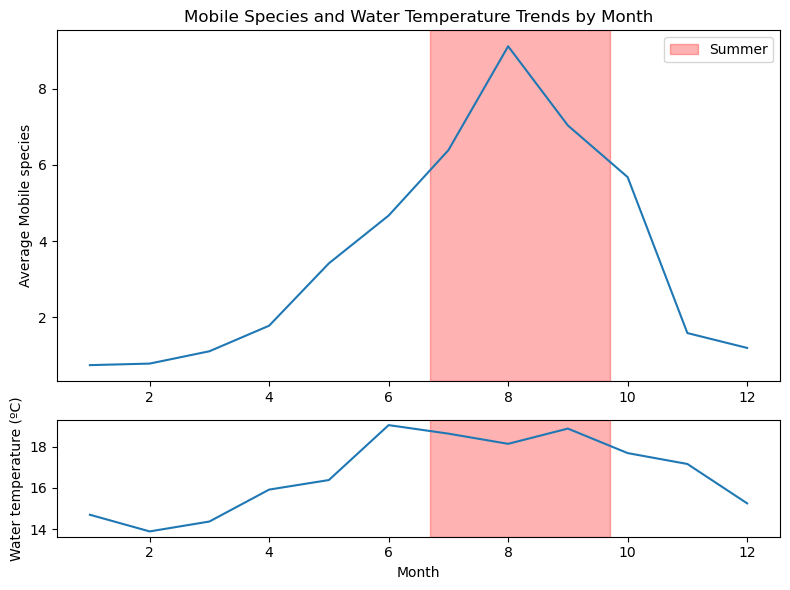

In [94]:
plot_seasonal_curve(species_mean, mean_water)

### Seasonal data for each year

The chart below displays the seasonal data for each year.

The summer season has the highest average number of species for most years, except for 2017 and 2018. On the other hand, winter season has the lowest average number of species for most years, except for 2017.

The year 2020 has the highest average number of species in summer (14.95) and the lowest average number of species in winter (0.47) among all years.

The average number of species **declined significantly from 2016 to 2018**, reaching the lowest values in autumn (0.00) and summer (0.70) of 2018.

In [66]:
mobil[mobil["year"] > 2011].groupby(["year", "season"])["TOTAL"].mean().hvplot.bar(
    title="Annual Average Number of Mobile Species by Season",
    width=1200,
    height=400,
).opts(xrotation=90)

:Bars   [year,season]   (TOTAL)

### What happened since 2016 ?

Let's divide the dataset we plotted above into two parts (before and after the start of 2016) and create a simple model to examine which variables influenced the mobile species behavior.

In [286]:
mobil = join_ocean_features(mobil, ocean_features)

In [287]:
features = [
    "Water temperature (ºC)",
    "Tide",
    "talk",
    "dic",
    "spco2",
    "sfco2",
    "ph_total",
    "hco3",
    "co3",
    "co2",
    "revelle_factor",
    "omega_ca",
    "omega_ar",
    "salinity",
    "temperature",
    "TOTAL",
]

mobil_by_season = mobil.groupby(["year", "season"])[features].mean()
mobil_by_season = mobil_by_season.rename(columns={"TOTAL": "Number of Mobile Species"})

### Which variables are most strongly correlated with Mobile Species (2012-2015)? 

According to the matrix, the variables with the highest absolute correlation with Number of Mobile Species are water temperature (0.80), spco2 (0.85), sfco2 (0.85), and ph_total (-0.86). This means that Number of Mobile Species has a strong positive relationship with water temperature, spco2, and sfco2, and a strong negative relationship with ph_total.

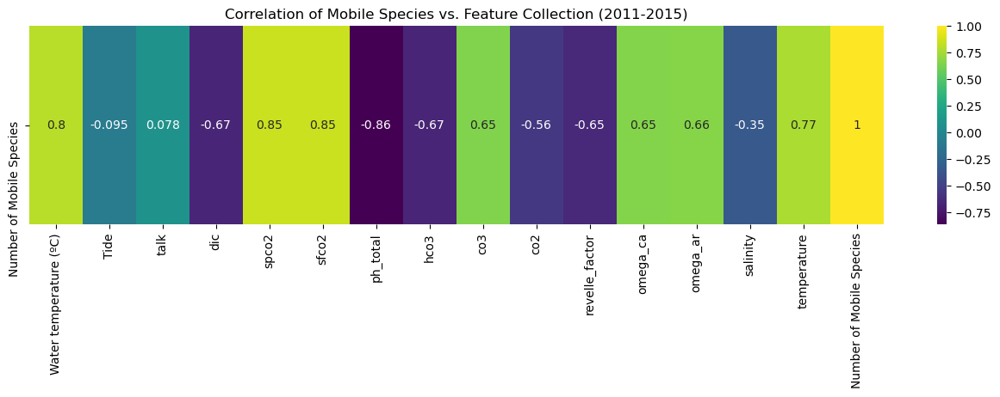

In [71]:
mobil_before_2016 = mobil_by_season.loc[:2015]
mobil_after_2016 = mobil_by_season.loc[2016:]

plt.figure(figsize=(16, 3))
cor1 = mobil_before_2016.corr().tail(1)
plt.title("Correlation of Mobile Species vs. Feature Collection (2011-2015)")
sns.heatmap(cor1, annot=True, cmap="viridis")

plt.show()

Since temperature influences many of these features (e.g if you increase the temperature of the water, its pH level decreases), we decide to start the analysis only with Water temperature variable in order to avoid multicollinearity issues. 

In the graph below, it is possible to verify that the water temperature has a good fit in the data until 2015.

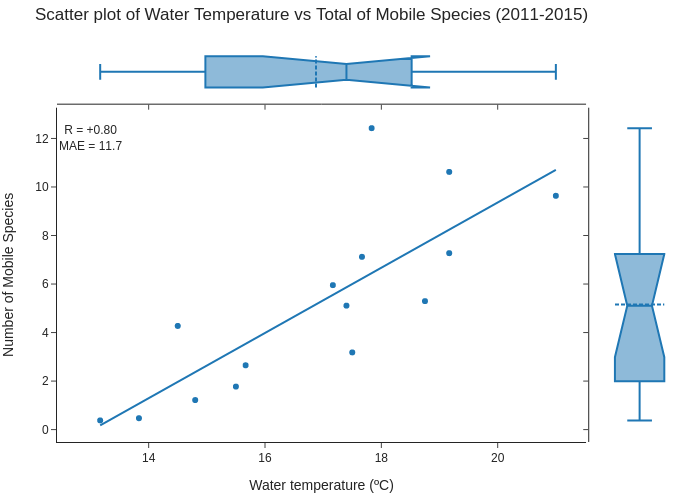

In [72]:
error_scatter(mobil_before_2016, "Water temperature (ºC)", "Number of Mobile Species", title="Scatter plot of Water Temperature vs Total of Mobile Species (2011-2015)").show("png")

We can interpret the results in this summary of an ordinary least squares (OLS) regression, which is a method of estimating the relationship between a dependent variable and one or more independent variables. In this case, the dependent variable is average mobile species and the independent variable is Water temperature (ºC). The summary shows some statistics and tests that can help us evaluate the quality and validity of the regression model. We can notice some of the main points:

•  The coefficient of Water temperature (ºC) is 1.3432, which means that for every one unit increase in water temperature, the expected value of average mobile species increases by 1.3432 units, holding everything else constant.

•  The coefficient of CONSTANT is -17.5074, which means that when water temperature is zero, the expected value of average mobile species is -17.5074 units (not make sense for this context).

•  The probability of each coefficient measures the p-value of the corresponding t-test. A smaller p-value means a more significant coefficient. The p-values of both coefficients are smaller than 0.05, which suggests that they are statistically significant at the 5% level or lower.

•  The R-squared is a measure of how well the regression model fits the data. It ranges from 0 to 1, with higher values indicating a better fit. The R-squared of this model is 0.6461, which means that about 64.61% of the variation in total can be explained by water temperature.


In [73]:
m1 = run_linear_regression(mobil_before_2016, var=["Water temperature (ºC)"])

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :Number of Mobile Species                Number of Observations:          15
Mean dependent var  :      5.1587                Number of Variables   :           2
S.D. dependent var  :      3.7269                Degrees of Freedom    :          13
R-squared           :      0.6461
Adjusted R-squared  :      0.6188
Sum squared residual:      68.825                F-statistic           :     23.7299
Sigma-square        :       5.294                Prob(F-statistic)     :   0.0003053
S.E. of regression  :       2.301                Log likelihood        :     -32.710
Sigma-square ML     :       4.588                Akaike info criterion :      69.421
S.E of regression ML:      2.1420                Schwarz criterion     :      70.837

-----------------------------------------------------------------

Multicollinearity is a problem that occurs when some or all of the predictor variables in a regression model are highly correlated with each other, which can cause instability and bias in the estimation of the regression coefficients. PCA can help to solve this problem by transforming the original predictor variables into a new set of uncorrelated variables called principal components (PCs), which capture most of the variation in the original data(stats.stackexchange.com). By using PCs instead of the original variables as predictors in the regression model, we can reduce or eliminate multicollinearity and improve the accuracy and interpretation of the model.

Let's try using PCA using Water Temperature with a new variable (ph level). By plotting the data along the first two PCs, we can see how the data are distributed and clustered in a two-dimensional space. In this case, PCA has divided the dataset into two sides or clusters, based on the values of the original features. The left side of the plot shows the data points that have values lower than the median (5.0) for most of the original features, while the right side of the plot shows the data points that have values higher than the median (5.0) for most of the original features. This suggests that there is a clear difference or contrast between these two groups of data points along the PCs. 

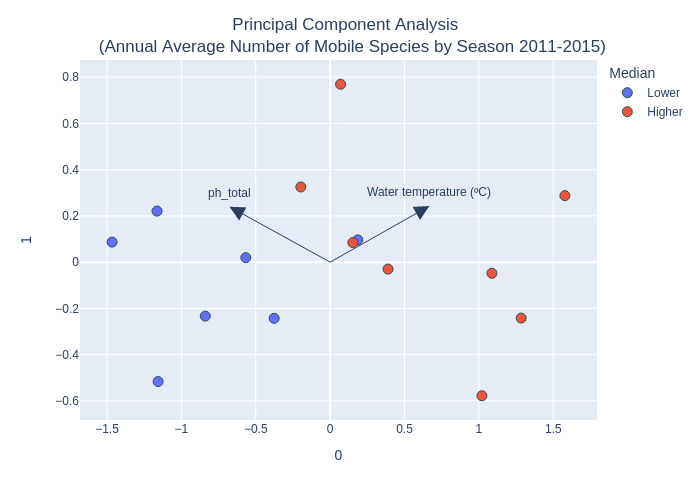

In [74]:
plot_pca_analysis(mobil_before_2016)

### Temperature influence on Mobile Species (2016-2020)

Now we are going to use the PCA model created above to test new data inputs (after 2016) in order to verify if these two variable (Water temperature and Ph level) can still explain what happened after 2016. 

In this chart below, we expected lower median values to be on the left side of the chart, based on the original data. But the new input data show some points with lower median values on the right side of the chart, which indicates that they are different from the original data and do not fit well with the PCA model. This suggests that the PCA model may not be appropriate or accurate for predicting or analyzing the new input data.

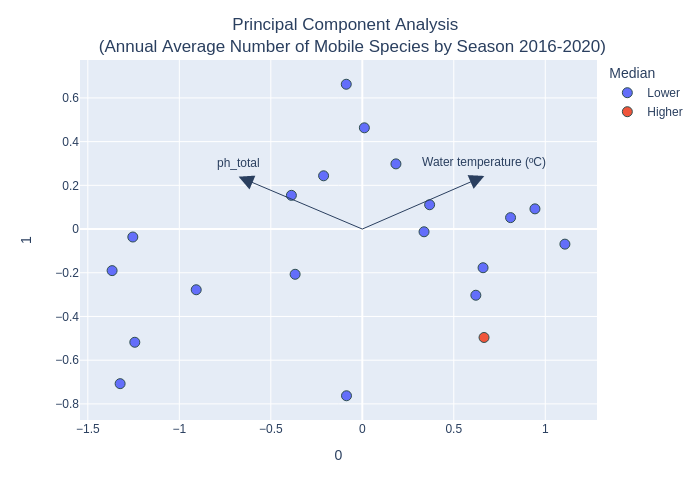

In [75]:
plot_pca_analysis(mobil_before_2016, mobil_after_2016, test=True)

Using the Linear regression model previously created, we also verified R2 decresed from (0.64) to (-1.12).
A negative R-squared implies that the model has a larger residual variance than the total variance, or equivalently, that the model has a larger mean squared error than the mean squared error of a horizontal line.

In [78]:
m1.intercept = m1.betas[0]  # Get the intercept from the betas array
m1.coefficients = m1.betas[
    1 : len(m1.betas)
]  # Get the coefficients from the betas array
y_hat_after = (
    m1.intercept + mobil_after_2016["Water temperature (ºC)"] * m1.coefficients[0][0]
)
y_hat_before = (
    m1.intercept + mobil_before_2016["Water temperature (ºC)"] * m1.coefficients[0][0]
)

print(
    f"OLS Model R2 (2012-2015): {r2_score(mobil_before_2016['Number of Mobile Species'], y_hat_before)}"
)

print(
    f"OLS Model R2 (2016-2020): {r2_score(mobil_after_2016['Number of Mobile Species'], y_hat_after)}"
)

lgbm_rmse_before = np.sqrt(mse(mobil_before_2016['Number of Mobile Species'], y_hat_before))
lgbm_rmse_after = np.sqrt(mse(mobil_after_2016['Number of Mobile Species'], y_hat_after))

OLS Model R2 (2012-2015): 0.6460646225271345
OLS Model R2 (2016-2020): -1.1243394346833755


The correlation between Species number and features approached close to zero, meaning that have a very weak linear relationship after 2016.

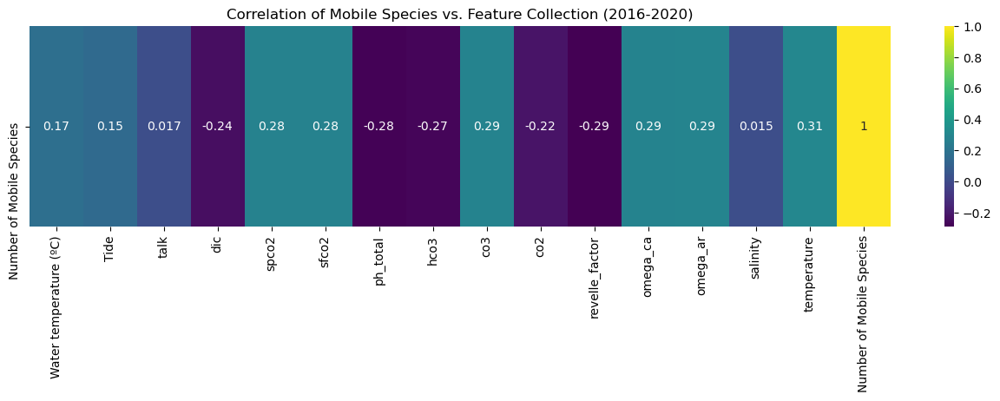

In [702]:
plt.figure(figsize=(16, 3))
cor1 = mobil_after_2016.corr().tail(1)
sns.heatmap(cor1, annot=True, cmap="viridis")
plt.title("Correlation of Mobile Species vs. Feature Collection (2016-2020)")
plt.show()

### Which features can explain why average number of species declined significantly from 2016 to 2018 ?

The Hercules storm was a strong low pressure system that hit Portugal from January 5th to 7th, 2014. It caused strong sea waves with long periods, run-ups between 6 to 9 m, and inundation depths mostly under 1 m. The storm damaged beaches, front streets, ports and marinas. However this event occured more than 2 years before the average number of species declined.

The chart below shows that the number of collected samples of mobile species by month has decreased since 2018. This may be influenced by some seasonal factors in 2018, such as autumn (zero species registered), but this does not explain why it has declined significantly in 2016 and 2017.

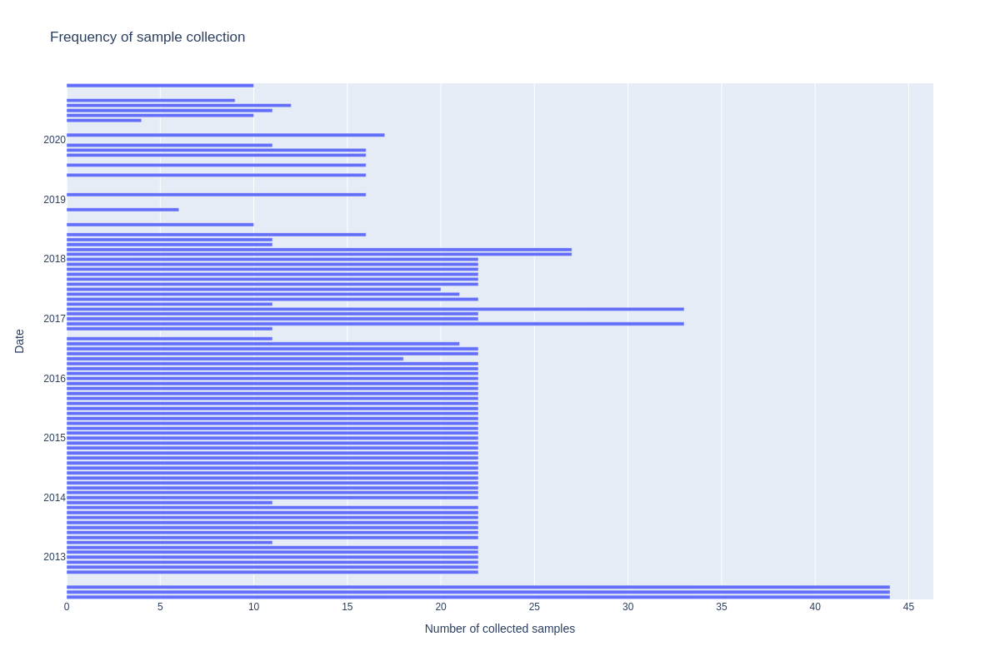

In [386]:
fig = px.bar(
    mobil.groupby(pd.Grouper(key="Date", freq="M"))["TOTAL"].agg("count"),
    
    orientation="h",
    width=1200,
    height=800,
    title='Frequency of sample collection'
)

fig.update_layout(xaxis_title="Number of collected samples",showlegend=False)

fig.show("png")

###  Fishing and Vessel movements analysis in the ocean

We are going to explore geographical data related to fishing and vessel movements in the ocean. We are particularly interested in how these activities interact with marine protected areas (MPAs), which are zones designated for the conservation of marine biodiversity and ecosystems. We will use various data files, such as  vessel tracking systems and fish catch reports from Global Fishing Watch, to analyze the spatial and temporal patterns of fishing and vessel movements in and around MPAs. Our goal is to understand the impacts of these activities on the marine environment and the effectiveness of MPAs as a conservation tool.

Let's visualize where the MPA is geographically located and how it is divided by zones and supratidal/middle intertidal regions.

In [208]:
zone_shp["zone"] = [
    "B-Supra",
    "A-Medium",
    "E-Medium",
    "A-Supra",
    "B-Medium",
    "D-Medium",
    "E-Supra",
    "D-Supra",
]
zone_shp.explore(
    column="zone",
    cmap=["black", "pink", "red", "green", "purple", "orange", "gray", "blue"],
    legend=True,
    #height=800,
    #width=800,
)

In [393]:
data_monthly, data_monthly_count, data_yearly = get_density_data(fishing_features)

In this analysis, we are going to work with a dataset that contains coordinate points near a marine protected area (MPA). Each row of the dataset represents a point on the map, and the columns include information such as fishing hours and number of vessels. 

In [470]:
data_monthly.describe()

,year,month,cell_ll_lat,cell_ll_lon,fishing_hours,mmsi_present
count,9794.00,9794.00,9794.00,9794.00,9794.00,9794.00
mean,2017.17,6.83,38.64,-9.42,0.60,5.48
std,1.89,3.24,0.03,0.06,1.84,6.26
min,2012.00,1.00,38.60,-9.50,0.00,1.00
25%,2016.00,4.00,38.62,-9.47,0.00,1.00
50%,2017.00,7.00,38.64,-9.43,0.00,3.00
75%,2019.00,9.00,38.66,-9.38,0.25,7.00
max,2020.00,12.00,38.70,-9.30,49.31,68.00


The map below visualizes this data by showing the intensity of fishing activity in each point by year. The darker (hot) the color, the more fishing hours and vessels are recorded. Our goal is to explore the spatial distribution of fishing activity around the MPA and identify any patterns or trends.

### Annual Vessel Presence in Grid Cells near the MPA: A Heat Map based on Satellite Data (2012-2020)

The animated map below displays the vessels recorded near the marine protected area (MPA) from 2012 to 2020. The number of vessels shows a gradual increase from 2012 to 2015, followed by a sharp rise from 2015 to 2018. This period corresponds to the peak of fishing activity around the MPA. However, in 2019, the number of vessels drops significantly, and continues to decline in 2020. This trend suggests a reduction of fishing pressure on the MPA in recent years.

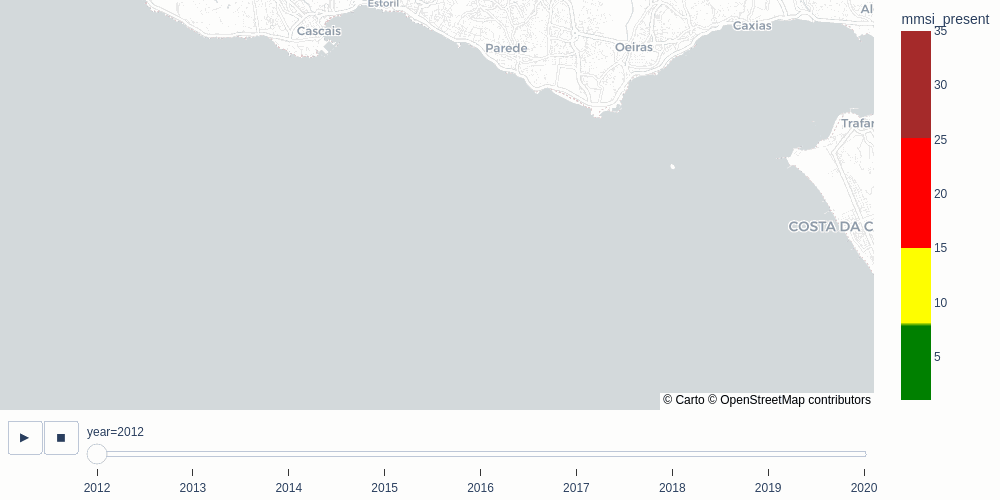

In [395]:
fig = plot_heatmap(
    data_yearly[data_yearly["mmsi_present"] > 0],
    column="mmsi_present",
    frame="year",
    lat="cell_ll_lat",
    long="cell_ll_lon",
    radius=45,
    width=1000,
    height=500,
)
generate_animated_gif(fig, "yearly_mmsi")

The chart below illustrates that trend where number of vessels increased rapidly from 2012 to 2017, reaching a peak of 525 vessels in summer 2018, then decreased gradually in 2019 and 2020. The number of vessels also varied significantly by season, with summer being the most popular season for fishing in most of the years, followed by autumn, spring and winter.

In [81]:
vessels = grouped_vessels()

vessels_unique = vessels.groupby(["date", "season", "year"])["mmsi"].nunique()

vessels_unique.groupby(["year", "season"]).sum().hvplot.bar(
    title="Annual Vessel Presence by Season", width=800
).opts(xrotation=90)

:Bars   [year,season]   (mmsi)

### Monthly Vessel presence in grid cells (2015-2020)

Let's display the vessels in more detail from 2015 to 2020, which is the period that corresponds to high vessel presence near the marine protected area (MPA). We will use a monthly data frequency this time.

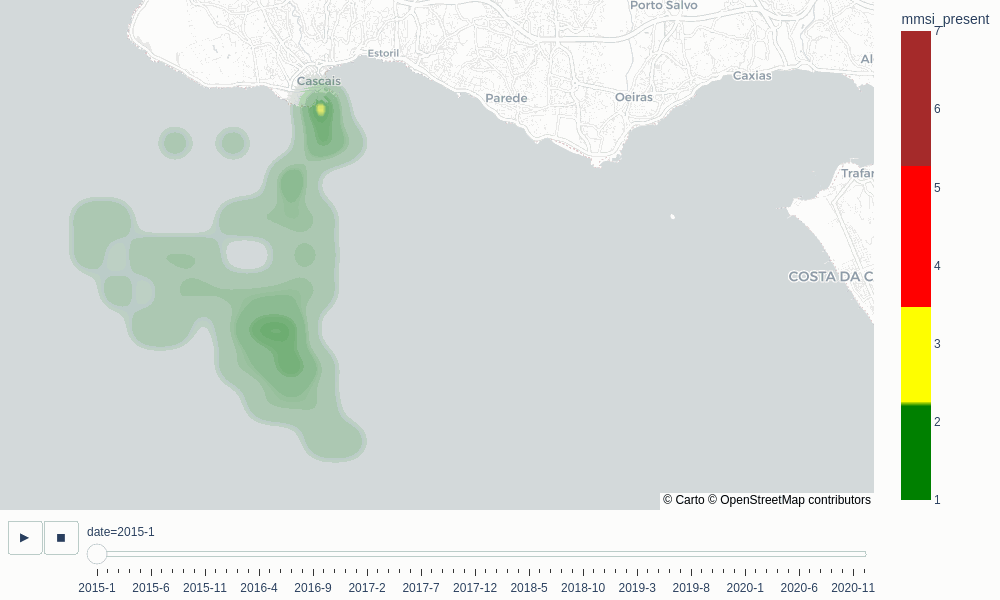

In [396]:
fig = plot_heatmap(
    data_monthly_count[(data_monthly_count["mmsi_present"] > 0) & (data_monthly["year"] > 2014)],
    column="mmsi_present",
    frame="date",
    lat="cell_ll_lat",
    long="cell_ll_lon",
    radius=50,
)

generate_animated_gif(fig, "monthly_mmsi", duration=1000)

### Fishing activity (hours)

The chart below shows the fishing hours by year and season from 2012 to 2020. It reveals low fishing hours between 2012 and 2014, and increase significantly from 2016 to 2018.

In [417]:
vessels.groupby(["year", "season"])["fishing_hours"].sum().hvplot.bar(
    title="Annual Fishing activity hours by Season", width=800
).opts(xrotation=90)

:Bars   [year,season]   (fishing_hours)

### Monthly fishing hours in grid cells (2015-2020)

The animated map provides a detailed illustration of the areas in the map of avencas with higher fishing activity.

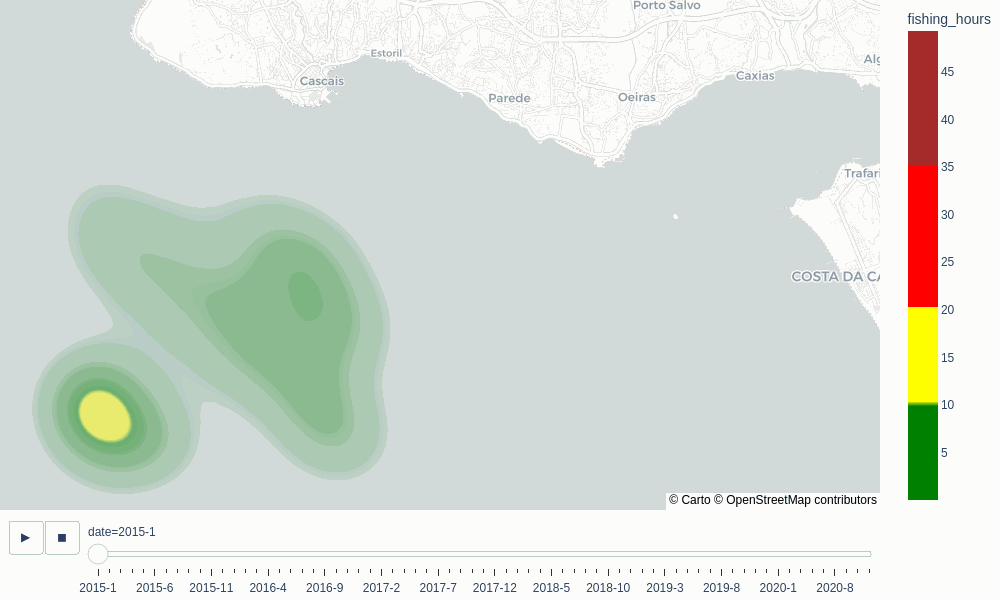

In [93]:
fig = plot_heatmap(
    data_monthly[(data_monthly["fishing_hours"] > 0) & (data_monthly["year"] > 2014)],
    column="fishing_hours",
    frame="date",
    lat="cell_ll_lat",
    long="cell_ll_lon",
    radius=100,
)

generate_animated_gif(fig, "monthly_fishing", duration=1000)

### Verifying fish impact using PCA model

We did not find a direct correlation between the fishing hours and the Average Number of Mobile Species, as we understand that the impact is not immediate. However, making the moving average it is possible to observe that this relationship is better captured.

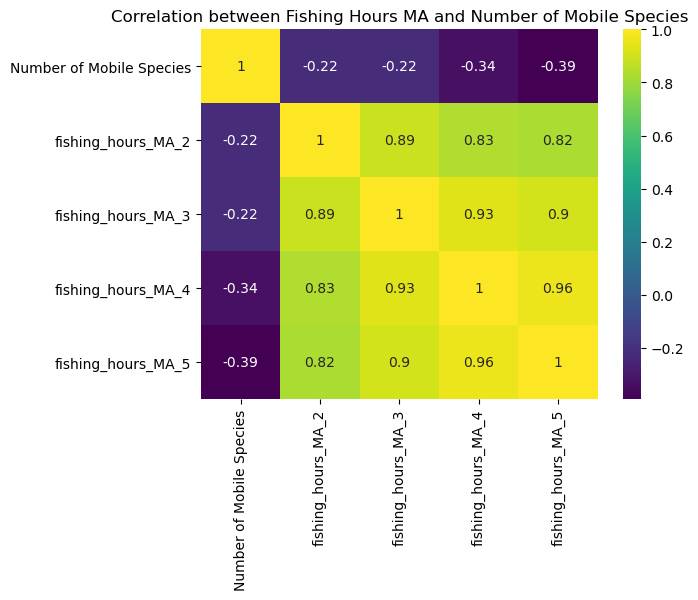

In [255]:
cor1 = mobil_inference[
    [
        "Number of Mobile Species",
        "fishing_hours_MA_2",
        "fishing_hours_MA_3",
        "fishing_hours_MA_4",
        "fishing_hours_MA_5",
    ]
].corr()

plt.title("Correlation between Fishing Hours MA and Number of Mobile Species")
sns.heatmap(cor1, annot=True, cmap="viridis")

plt.show()

Using PCA with Fishing hours Moving average of 5 periods, Temperature and Dissolved inorganic carbon in sea water (DIC) as features, we can capture more variance and distinguish the samples better than using other variables.

In [84]:
mobil_inference = prepare_features(mobil)

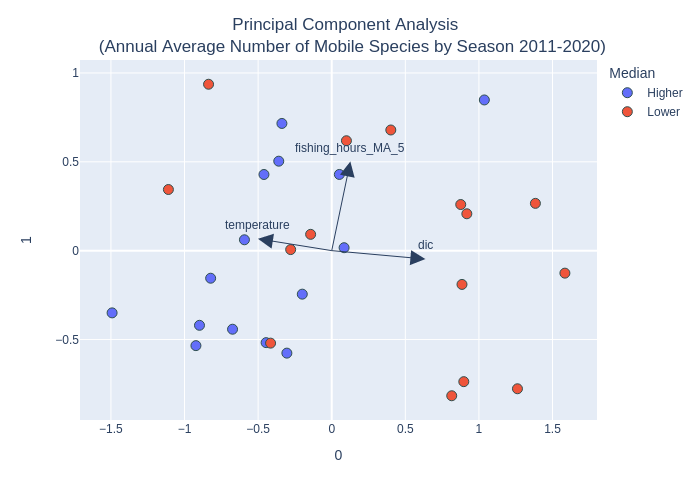

In [89]:
pca_model(mobil_inference, features=["fishing_hours_MA_5", "dic", "temperature"])

In [195]:
features = [
    "fishing_hours_MA_5",
    "temperature",
    "dic",
    "Number of Mobile Species",
    "Water temperature (ºC)",
    
] 

In this section, we performed an exploratory data analysis (EDA) to understand the dynamics of marine species in the MPA area and the factors that influence their movement. We used various techniques such as descriptive statistics, visualization, and correlation analysis to examine the data and identify patterns and trends. We found that the average of fishing activity and temperature were quite useful variables to explain the big picture of the marine species distribution and behavior. These variables showed significant associations with the presence mobile species in the MPA area. The DIC variable (Dissolved norganic carbon in sea water) could improve the model inference as well. We aim our EDA provided valuable insights for further research and management of the marine ecosystem.

##  4 - <span style="color:blue">Forecasting Model</span>  <a class="anchor" id="fourth-bullet"></a>

By adding 'fishing_hours_MA_5' as a predictor variable, we increased the R2 of the Linear Regression model compared to the model that only uses water temperature.

In [297]:
cat_data = mobil[features].copy()

In [198]:
reg = cat_data.copy()
reg['season'] = cat_data['season'].replace({'winter': 0, 'autumn': 1, 'spring': 2, 'summer':3})

In [202]:
m1 = run_linear_regression(reg, var=[
    'fishing_hours_MA_5',
    "temperature"
])

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :Number of Mobile Species                Number of Observations:          30
Mean dependent var  :      3.2757                Number of Variables   :           3
S.D. dependent var  :      3.7621                Degrees of Freedom    :          27
R-squared           :      0.3712
Adjusted R-squared  :      0.3246
Sum squared residual:     258.105                F-statistic           :      7.9682
Sigma-square        :       9.559                Prob(F-statistic)     :    0.001907
S.E. of regression  :       3.092                Log likelihood        :     -74.851
Sigma-square ML     :       8.603                Akaike info criterion :     155.701
S.E of regression ML:      2.9332                Schwarz criterion     :     159.905

-----------------------------------------------------------------

Next, we will apply a more advanced model based on the catboost library for gradient boosting on decision trees and use SHAP values to interpret the influence of each variable.  RMSE is more sensitive to outliers and may overestimate the error for zero values. Tweedie loss is a generalization of Poisson and gamma distributions and can handle both count and continuous data.

In [301]:
X = cat_data[features].copy()
y = X.pop("Number of Mobile Species")

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, shuffle=False)

model = cb.CatBoostRegressor(
    iterations=100,
    silent=True,
    loss_function="Tweedie:variance_power=1.1"
)

model.fit(
    X_train,
    y_train,
    verbose=False,
    early_stopping_rounds=10,
)

y_pred = model.predict(X_test)

lgbm_rmse = np.sqrt(mse(y_test, y_pred))
print("RMSE", np.mean(lgbm_rmse))

RMSE 3.3791062337825952


In [214]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train)
expected_value = explainer.expected_value

### Feature importance - Average impact on model output magninitude

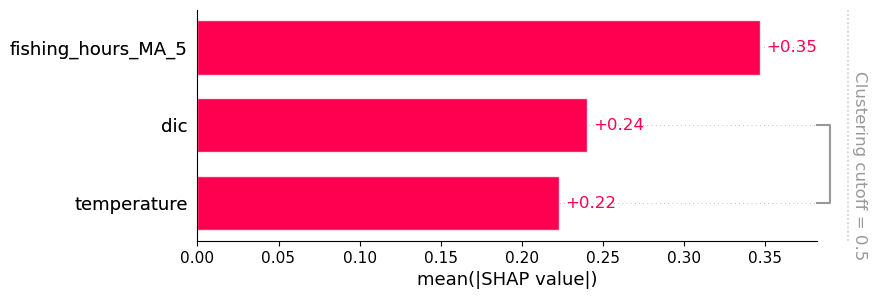

In [211]:
clustering = shap.utils.hclust(X_train, y_train)
shap.plots.bar(shap_values, clustering=clustering)

SHAP force_plot is a function that visualizes the given SHAP values with an additive force layout. SHAP values are a way of measuring how much each feature contributes to the model output for a given instance. The  visualization shows the impact of each feature on the model output for each instance interactively, which means that we can explore the data and the model in more detail by clicking on x-axis or y-axis picklist.

In [153]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values.values, X_train)

The chart below shows a shap value heatmap of train data, which is a plot that shows the impact of each model input on the model output for each instance. The instances are on the x-axis, the model inputs are on the y-axis, and the shap values are encoded on a color scale. The shap values measure how much each model input changes the model output from its expected value. Positive shap values indicate that the model input increases the model output, while negative shap values indicate that the model input decreases the model output.

We can see the Fishing hour feature contributed to explatin the negative moviment during 2016-2018 and positively from 2018-2020

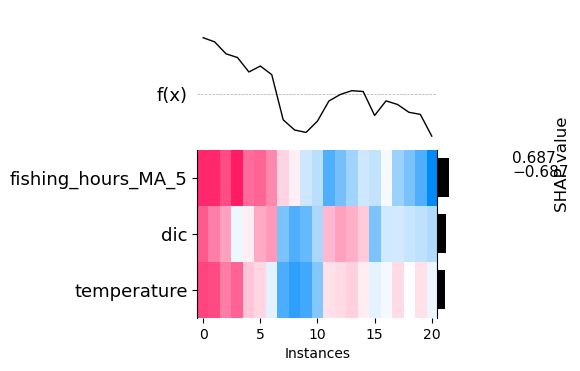

In [326]:
shap.plots.heatmap(shap_values, plot_width=8)

### Test Data impact

In [329]:
explainer = shap.Explainer(model)
shap_values = explainer(X_test)
expected_value = explainer.expected_value

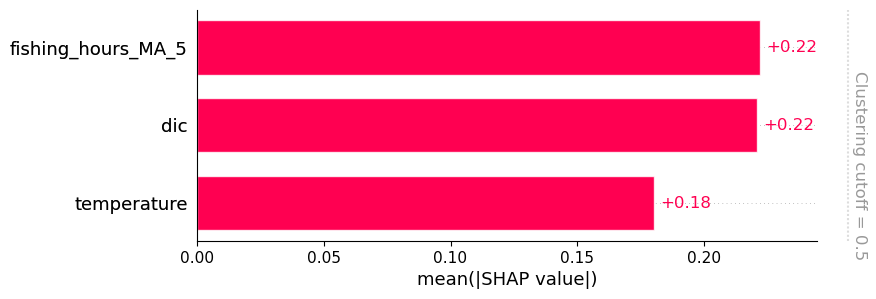

In [330]:
clustering = shap.utils.hclust(X_test, y_test)
shap.plots.bar(shap_values, clustering=clustering)

In [331]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values.values, X_train)

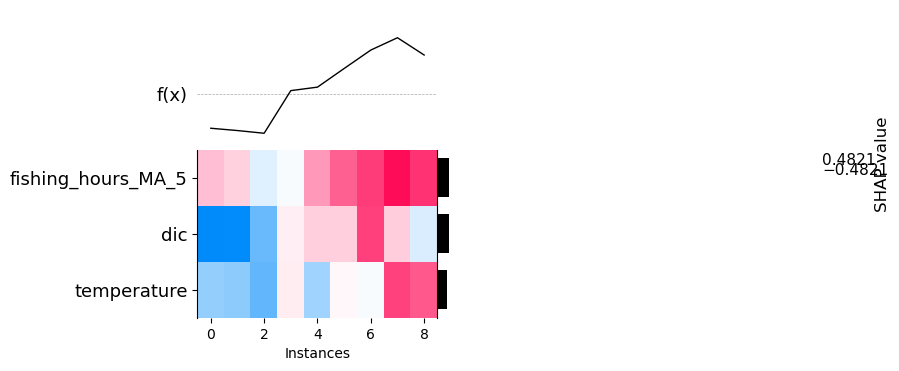

In [327]:
shap.plots.heatmap(shap_values)

We studied the time series data of marine species in the MPA area at a top level, aggregating the data by year and season. We analyzed the trends and patterns of the species presence and abundance over time and across seasons. We also examined the effects of environmental and human factors such as fishing and temperature on the marine ecosystem. 

##  5 - <span style="color:blue">Determining Species Iteration</span>  <a class="anchor" id="fifth-bullet"></a>

### Association rule mining in mobile marine species

Association rule mining is a technique that finds patterns and relationships between data species of the same sample that was collected.
 
The table below shows the results of applying association rule mining to mobile marine species. The table has 10 columns, each representing a different measure of the association rules. The rows are the rules themselves, which have the form of "if antecedents then consequents". Antecedents and consequents are sets of items that occur together in the data. For example, the first rule says that if Caboz N.I. and Chiton sp. are present, then Palaemon serratus is also present.


In [151]:
species_activity = mobil[mobil['TOTAL'].gt(0)].iloc[:, 9:-37].gt(0)
frequency_species = apriori(species_activity, min_support=0.01, use_colnames=True, verbose=1)

Processing 120 combinations | Sampling itemset size 4


Support Value -> shows that the rate of seeing Chiton sp. and Caboz N.I. together in a sampling is 0.01.

Confidence Value -> shows that 89% of the sampling who got Chiton sp. and Caboz N.I. also got Palaemon serratus.

Lift Value -> shows that appearences of (Palaemon serratus) increases by 2.38 appearences Chiton sp. and Caboz N.I.

In [230]:
frequency_species['length'] = frequency_species['itemsets'].apply(lambda x: len(x))
rules = association_rules(frequency_species, metric= "confidence", min_threshold = 0.1)

rules = rules.sort_values(['confidence', 'lift'], ascending =[False, False]) 

rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
55,"(Caboz N.I., Chiton sp. )",(Palaemon serratus),0.01,0.37,0.01,0.89,2.38,0.01,5.64,0.59
61,"(Caboz N.I., Gobius sp.)",(Palaemon serratus),0.01,0.37,0.01,0.88,2.35,0.01,5.02,0.58
28,(Gobius sp.),(Palaemon serratus),0.04,0.37,0.03,0.75,2.01,0.01,2.51,0.52
42,"(Caboz N.I., Nasariidae (búzio))",(Palaemon serratus),0.05,0.37,0.04,0.74,1.99,0.02,2.44,0.52
7,(Eriphia verrucosa),(Caboz N.I.),0.02,0.37,0.02,0.73,1.97,0.01,2.36,0.50


In [153]:
species_network = rules.copy()
rules['antecedents'] = rules['antecedents'].apply(list).astype(str)
rules['consequents'] = rules['consequents'].apply(list).astype(str)

In [154]:
frequency_species['itemsets'] = frequency_species['itemsets'].apply(list).astype(str)

The itemsets are sets of marine species that co-occur frequently in the dataset. 
The chart below shows that most frequenty species are Palaemon Serratus and Caboz N.I.
They both has a support of 0.37, which means that 37% of the samples collected contain one of them.

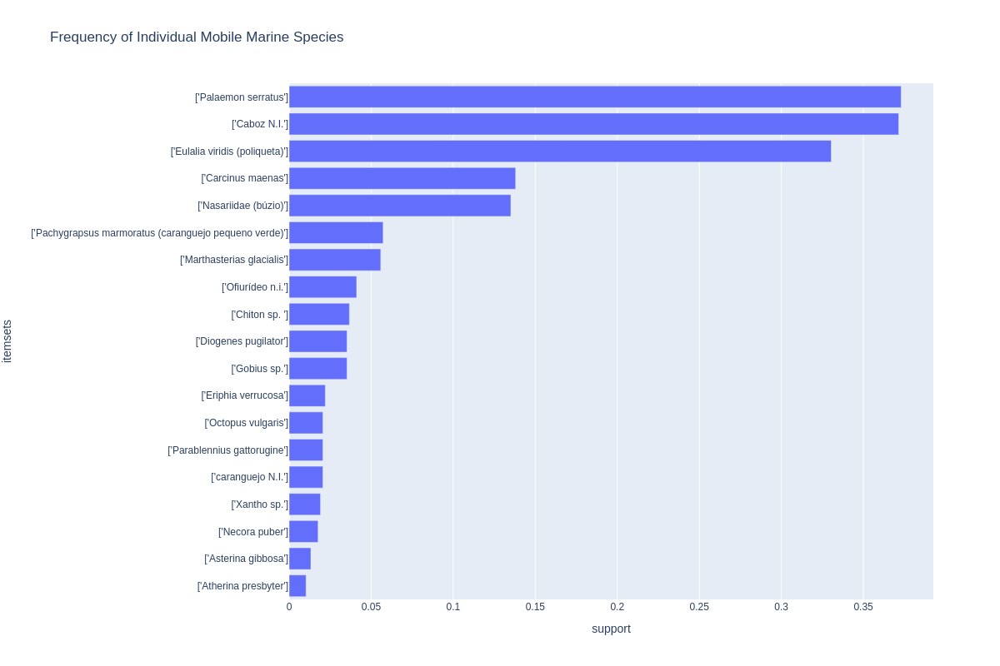

In [337]:
fig = px.bar(
    frequency_species[frequency_species["length"] == 1].sort_values(by="support"),
    x="support",
    y="itemsets",
    orientation="h",
    width=1200,
    height=800,
    title='Frequency of Individual Mobile Marine Species'
    
)
fig.show("png")

On the chart below we can verify that the support of Caboz N.I. and Palaemon serratus is 0.18, which means that 18% of the samples collected in the dataset contain both Caboz N.I. and Palaemon serratus.

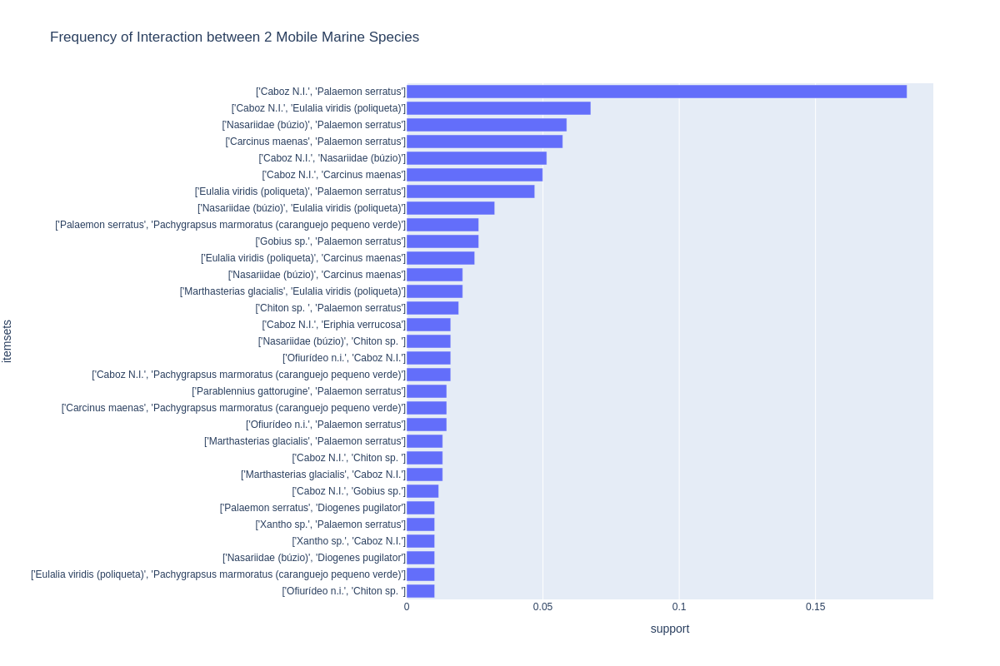

In [338]:
fig = px.bar(
    frequency_species[frequency_species["length"] == 2].sort_values(by="support"),
    x="support",
    y="itemsets",
    orientation="h",
    width=1200,
    height=800,
    title='Frequency of Interaction between 2 Mobile Marine Species '
)
fig.show("png")

### Network chart of rule mining associations

A network chart of rule mining associations is a graphical representation of the relationships between species in the dataset. It can be used to monitor and explore patterns of co-occurrence, correlation, or causation among the items. It contains nodes and edges, where nodes represent the specie and edges represent the associations between them. To interpret a network chart of rule mining associations, one can look at the following aspects:

•  The number and size of nodes: This indicates how many species are involved in the associations and how frequently they appear in the dataset.

•  The number and length of edges: This indicates how many associations are found and how strong they are. Shorter edges imply stronger associations, while longer edges imply weaker associations.

•  The centrality and degree of nodes: This indicates how important or influential a species is in the network, based on how many edges it has or how connected it is to other nodes.

•  The direction of edges: This indicates whether the association is positive or negative, causal or non-causal.

•  The clusters of nodes: This indicates whether some items tend to co-occur or correlate more often than others, forming groups or subgroups within the network.

Reference: [1]


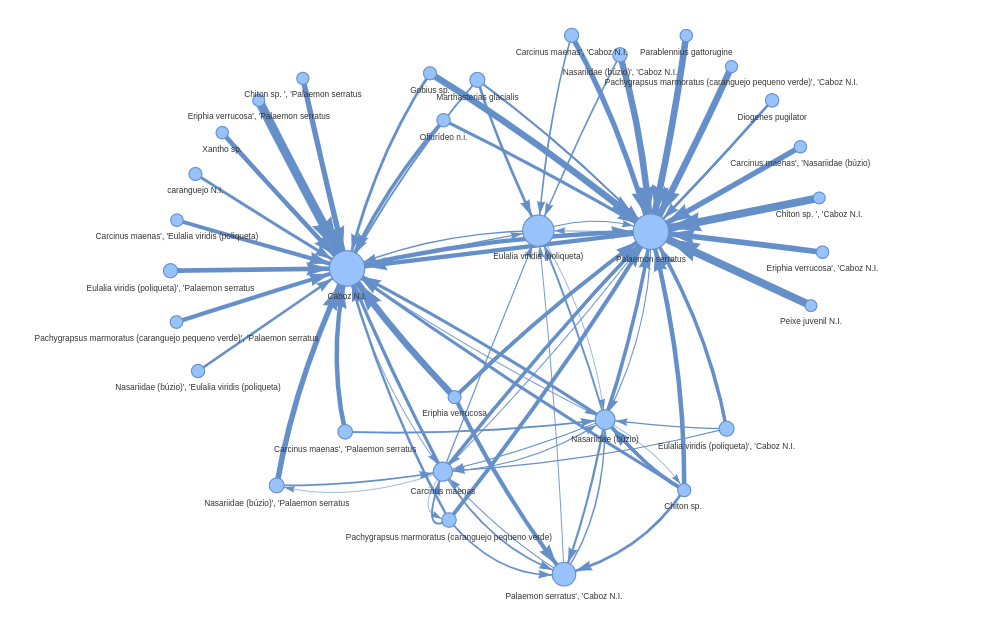

In [184]:
plot_species_network(species_network, plot=True)

##  6 - <span style="color:blue">Conclusion</span>  <a class="anchor" id="sixth-bullet"></a>

The research aimed to investigate the factors affecting the number of mobile species in the MPA. The results showed that the number of species varied by season and year, and had different relationships with the environmental variables over time. The research also suggested that fishing activity had a negative and delayed impact on the number of species. The research demonstrated the use of various data sources and analytical methods to explore and explain the complex dynamics of the marine ecosystem.

##  7 - <span style="color:blue">References</span>  <a class="anchor" id="seventh-bullet"></a>

[1] Visualizing association rules in hierarchical groups :https://link.springer.com/article/10.1007/s11573-016-0822-8

##  8 - <span style="color:blue">Appendix 1: Main Functions</span>  <a class="anchor" id="eithth-bullet"></a>

In [ ]:
!pip install hvplot
!pip install geopandas
!pip install geoviews
!pip install cartopy
!pip install contextily
!pip install dask
!pip install -U kaleido
!pip install seaborn
!pip install catboost
!pip install pysal
!pip install shap

In [4]:
!apt-get install megatools
!megadl 'https://mega.nz/#!kdVhlQpA!6iUcPI3UA4bQuLl9iCNa8uOh0nnGtsmGMH6eCxw_9As'

Downloaded lisbon_ficheiros_WDL.zip33;1m99,91% - 1011,2 MiB (1.060.316.368 bytes) of 1012,1 MiB (1,2 MiB/s)0K


In [8]:
path = "./mmsi-daily-csvs-10-v2-2012/"

In [202]:
!unzip ./cascais_data/e5e2a610-f2b2-11ed-9e09-01a6dd02de70.zip

Archive:  ./cascais_data/e5e2a610-f2b2-11ed-9e09-01a6dd02de70.zip
  inflating: mmsi-daily-csvs-10-v2-2020.zip  
  inflating: mmsi-daily-csvs-10-v2-2019.zip  
  inflating: mmsi-daily-csvs-10-v2-2018.zip  
  inflating: mmsi-daily-csvs-10-v2-2017.zip  
  inflating: mmsi-daily-csvs-10-v2-2016.zip  
  inflating: mmsi-daily-csvs-10-v2-2015.zip  
  inflating: mmsi-daily-csvs-10-v2-2014.zip  
  inflating: mmsi-daily-csvs-10-v2-2013.zip  
  inflating: mmsi-daily-csvs-10-v2-2012.zip  


In [9]:
data = pd.DataFrame()
for year in [i for i in range(2012, 2021)]:
    path = f"./mmsi-daily-csvs-10-v2-{year}/"
    for path_file in glob.glob(os.path.join(path, "*.csv")):
        vessels = pd.read_csv(path_file)
        vessels = vessels[
            (vessels["cell_ll_lat"].between(38.6, 38.7))
            & vessels["cell_ll_lon"].between(-9.5, -9.3)
        ]
        data = pd.concat([data, vessels])

In [2]:
def load_dataset(file):
    """
    Load a specific dataset to be analyzed
    """
    if file == "Municipality":
        xls = pd.ExcelFile("cascais_data/AMPA_Data_Sample.xlsx")
        sessil = pd.read_excel(xls, "Sessil (% Coverage)")
        mobil = pd.read_excel(xls, " Mobil (nº individuals)")
        mobil = mobil.iloc[:, :-3]
        mobil.drop(mobil.tail(93).index, inplace=True)
        invasive_conservat = pd.read_excel(
            xls, "Invasive_conservat species list", header=1
        )
        
        
        
        mobil["Date_"] = pd.to_datetime(
            mobil["Date"].astype(str)
            + " "
            + mobil["Hour"].astype(str).str.replace(".", ":", regex=False)
        )
        
        mobil['Date'] = mobil['Date_'].dt.to_period('M').dt.to_timestamp()

        return sessil, mobil, invasive_conservat

    if file == "Metereology":
        metereology = pd.read_csv(
            "metereology_cascais.csv", encoding="ISO-8859-1", usecols=[0, 1, 3]
        )
        metereology.columns = ["Date", "precipitation", "wind_speed"]
        metereology["Date"] = pd.to_datetime(metereology["Date"])
        metereology = metereology.set_index("Date")

        return metereology

    if file == "OceanSODA":
        ocean = pd.read_csv("cascais_data/features.csv")
        ocean = ocean[ocean.columns.drop(list(ocean.filter(regex='uncert')))]
        ocean['time'] = pd.to_datetime(ocean['time'])
        
        return ocean
    
    if file == "Fishing":
        vessels = pd.read_csv('vessels_full.csv')
        vessels['date'] = pd.to_datetime(vessels['date'])
        
        return vessels

    if file == "Shapefile":
        path = "./cascais_data/shapefile/"
        shp_file = pd.concat(
            map(gpd.read_file, glob.glob(os.path.join(path, "*.shp")))
        ).reset_index(drop=True)
        
        return shp_file

In [90]:
def pca_model(x, features):
    features = features


    median = x["Number of Mobile Species"].median()
    x["Median"] = "0"
    x.loc[
        (x["Number of Mobile Species"] < median),
        "Median",
    ] = "Lower"
    x.loc[
        (x["Number of Mobile Species"] >= median),
        "Median",
    ] = "Higher"



    trans = RobustScaler()
    X = trans.fit_transform(x[features])

    pca = PCA(n_components=2)
    components = pca.fit_transform(X)

    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

    fig = px.scatter(
        components,
        x=0,
        y=1,
         color=x["Median"],
    )
    fig.update_layout(
        legend_title_text="Median",
        title_text="Principal Component Analysis  <br> (Annual Average Number of Mobile Species by Season 2011-2020)",
        title_x=0.5,
    )

    for i, feature in enumerate(features):
        fig.add_annotation(
            ax=0,
            ay=0,
            axref="x",
            ayref="y",
            x=loadings[i, 0],
            y=loadings[i, 1],
            showarrow=True,
            arrowsize=3,
            arrowhead=2,
            xanchor="right",
            yanchor="top",
        )
        fig.add_annotation(
            x=loadings[i, 0],
            y=loadings[i, 1],
            ax=0,
            ay=0,
            xanchor="center",
            yanchor="bottom",
            text=feature,
            yshift=5,
        )

    fig.update_traces(marker=dict(size=10,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))    

    return fig.show("png")

In [3]:
def get_mean(data, col):
    """
    Get mean by month
    """
    data = (
        mobil.groupby(["year", "month", "Zone", "Supratidal/Middle Intertidal"])[[col]]
        .mean()
        .reset_index()
    )

    mean_by_zone = (
        data.groupby(["month", "Zone", "Supratidal/Middle Intertidal"])[col]
        .mean()
        .reset_index()
    )

    mean = mean_by_zone.groupby(["month"])[col].mean().reset_index()

    return mean

In [4]:
def get_density_data(data):
    """Prepare dataframe to plot density maps"""

    data["date"] = pd.to_datetime(data["date"])
    data["month"] = data["date"].dt.month
    data["year"] = data["date"].dt.year

    data_count = (
        data.groupby(["date", "cell_ll_lat", "cell_ll_lon"])["mmsi_present"]
        .nunique()
        .reset_index()
    )

    data_count["month"] = data_count["date"].dt.month
    data_count["year"] = data_count["date"].dt.year

    data_count_monthly = (
        data_count.groupby(["year", "month", "cell_ll_lat", "cell_ll_lon"])[
            "mmsi_present"
        ]
        .sum()
        .reset_index()
    )

    data_count_monthly["date"] = (
        data_count_monthly["year"].astype(str)
        + "-"
        + data_count_monthly["month"].astype(str)
    )

    data_monthly = (
        data.groupby(["year", "month", "cell_ll_lat", "cell_ll_lon"])["fishing_hours"]
        .sum()
        .reset_index()
    )

    data_monthly["date"] = (
        data_monthly["year"].astype(str) + "-" + data_monthly["month"].astype(str)
    )

    data_yearly = (
        data_count.groupby(["year", "cell_ll_lat", "cell_ll_lon"])["mmsi_present"]
        .sum()
        .reset_index()
    )

    return data_monthly, data_count_monthly, data_yearly

In [414]:
# Model
def run_cv_model(
    categorical_indices,
    train,
    test,
    target,
    model_fn,
    params={},
    eval_fn=None,
    label="model",
    n_folds=5,
):
    kf = KFold(n_splits=n_folds)
    fold_splits = kf.split(train, target)
    cv_scores = []
    pred_full_test = 0
    pred_train = np.zeros((train.shape[0]))
    feature_importances = pd.DataFrame()
    feature_importances["feature"] = test.columns
    i = 1
    for dev_index, val_index in fold_splits:
        print("-------------------------------------------")
        print("Started " + label + " fold " + str(i) + f"/{n_folds}")
        dev_X, val_X = train.iloc[dev_index], train.iloc[val_index]
        dev_y, val_y = target.iloc[dev_index], target.iloc[val_index]
        params2 = params.copy()
        pred_val_y, pred_test_y, fi = model_fn(
            categorical_indices, dev_X, dev_y, val_X, val_y, test, params2
        )
        feature_importances[f"fold_{i}"] = fi
        pred_full_test = pred_full_test + pred_test_y
        pred_train[val_index] = pred_val_y
        if eval_fn is not None:
            cv_score = eval_fn(val_y, pred_val_y)
            cv_scores.append(cv_score)
            print(label + " cv score {}: {}".format(i, cv_score), "\n")
        i += 1
    print("{} cv scores : {}".format(label, cv_scores))
    print("{} cv mean score : {}".format(label, np.mean(cv_scores)))
    print("{} cv std score : {}".format(label, np.std(cv_scores)))
    pred_full_test = pred_full_test / n_folds
    results = {
        "label": label,
        "train": pred_train,
        "test": pred_full_test,
        "cv": cv_scores,
        "fi": feature_importances,
    }
    return results


def runCAT(categorical_indices, train_X, train_y, test_X, test_y, test_X2, params):
    # Pool the data and specify the categorical feature indices
    print("Pool Data")
    _train = Pool(train_X, label=train_y, cat_features=categorical_indices)
    _valid = Pool(test_X, label=test_y, cat_features=categorical_indices)
    print("Train CAT")
    model = CatBoostClassifier(**params)
    fit_model = model.fit(
        _train, eval_set=_valid, use_best_model=True, verbose=1000, plot=False
    )
    feature_im = fit_model.feature_importances_
    print("Predict 1/2")
    pred_test_y = fit_model.predict_proba(test_X)[:, 1]
    print("Predict 2/2")
    pred_test_y2 = fit_model.predict_proba(test_X2)[:, 1]
    return pred_test_y, pred_test_y2, feature_im


# Use some baseline parameters
cat_params = {
    "loss_function": "CrossEntropy",
    "eval_metric": "AUC",
    "task_type": "GPU",
    "learning_rate": 0.01,
    "iterations": 10000,
    "random_seed": 42,
    "od_type": "Iter",
    #               'bagging_temperature': 0.2,
    #               'depth': 10,
    "early_stopping_rounds": 500,
}

n_folds = 5
results = run_cv_model(
    ["Weather Condition", "Zone", "Supratidal/Middle Intertidal", "Substrate"],
    train,
    test,
    target,
    runCAT,
    cat_params,
    auc,
    "cat",
    n_folds=n_folds,
)

In [5]:
def grouped_vessels():
    ''' Load vessels dataset'''
    x = pd.read_csv("vessels.csv", parse_dates=["date"])
    x["year"] = x["date"].dt.year
    x["month"] = x["date"].dt.month
    x["day"] = x["date"].dt.day

    date = x["date"].dt.month * 100 + x["date"].dt.day
    x["season"] = pd.cut(
        date,
        [0, 321, 620, 922, 1220, 1300],
        labels=["winter", "spring", "summer", "autumn", "winter "],
    ).str.strip()
    
    return x

In [6]:
def join_ocean_features(mobil, ocean_features):

    pca_analysis = mobil.merge(
        ocean_features, right_on="time", left_on="Date", how="left"
    )
    fishing_features["year"] = fishing_features["date"].dt.year
    fishing_features["month"] = fishing_features["date"].dt.month
    fishing_features["date"] = pd.to_datetime(
        fishing_features[["year", "month"]].assign(DAY=1)
    )
    fishing_ = (
        fishing_features.groupby("date")[["fishing_hours", "mmsi_present", "hours"]]
        .sum()
        .reset_index()
    )
    pca_analysis = pca_analysis.merge(
        fishing_, left_on="Date", right_on="date", how="left"
    )
    pca_analysis = pca_analysis.dropna()

    return pca_analysis

In [7]:
def generate_animated_gif(fig, name, duration=3000):
    '''Transform dynamic maps into animation'''
    # generate images for each step in animation
    frames = []
    for s, fr in enumerate(fig.frames):
        # set main traces to appropriate traces within plotly frame
        fig.update(data=fr.data)
        # move slider to correct place
        fig.layout.sliders[0].update(active=s)
        # generate image of current state
        frames.append(PIL.Image.open(io.BytesIO(fig.to_image(format="png"))))

    # create animated GIF
    frames[0].save(
        f"{name}.gif",
        save_all=True,
        append_images=frames[1:],
        optimize=True,
        duration=duration,
        loop=0,
    )

    with open(f"{name}.gif", "rb") as f:
        display(Image(data=f.read(), format="png"))

In [8]:
def run_linear_regression(mobil_before_2016, var="Water temperature (ºC)"):
    ''' Perform Linear Regression Analysis'''
    
    variable_names = var

    # Fit OLS model
    m1 = spreg.OLS(
        # Dependent variable
        mobil_before_2016[["Number of Mobile Species"]].values,
        # Independent variables
        mobil_before_2016[variable_names].values,
        # Dependent variable name
        name_y="Number of Mobile Species",
        # Independent variable name
        name_x=variable_names,
    )
    print(m1.summary[:-580])
    
    return m1

In [140]:
def prepare_features(mobil): 
    ''' Generate new features'''
    
    data = mobil.copy()
    
    features_mean = [
        "Water temperature (ºC)",
        "Tide",
        "talk",
        "dic",
        "spco2",
        "sfco2",
        "ph_total",
        "hco3",
        "co3",
        "co2",
        "revelle_factor",
        "omega_ca",
        "omega_ar",
        "salinity",
        "temperature",
        "TOTAL",
    ]

    features_sum = ["fishing_hours", "mmsi_present", "hours", "fishing"]

    features = features_mean + features_sum

    a = {i: "mean" for i in features_mean}
    b = {i: "sum" for i in features_sum}

    z = {**a, **b}

    x = data.groupby(["year", "season"])[features].agg(z)

    x[["mmsi_present_MA_5", "hours_MA_5", "fishing_hours_MA_5", "fishing_MA_5"]] = (
        x[["mmsi_present", "hours", "fishing_hours", "fishing"]].rolling(window=5).mean()
    )

    x[["mmsi_present_MA_4", "hours_MA_4", "fishing_hours_MA_4", "fishing_MA_4"]] = (
        x[["mmsi_present", "hours", "fishing_hours", "fishing"]].rolling(window=4).mean()
    )

    x[["mmsi_present_MA_3", "hours_MA_3", "fishing_hours_MA_3", "fishing_MA_3"]] = (
        x[["mmsi_present", "hours", "fishing_hours", "fishing"]].rolling(window=3).mean()
    )

    x[["mmsi_present_MA_2", "hours_MA_2", "fishing_hours_MA_2", "fishing_MA_2"]] = (
        x[["mmsi_present", "hours", "fishing_hours", "fishing"]].rolling(window=2).mean()
    )

    x[["mmsi_present_lag_1", "hours_lag_1", "fishing_hours_lag_1"]] = x[
        ["mmsi_present", "hours", "fishing_hours"]
    ].shift(1)

    x[["mmsi_present_lag_2", "hours_lag_2", "fishing_hours_lag_2"]] = x[
        ["mmsi_present", "hours", "fishing_hours"]
    ].shift(2)

    x[["mmsi_present_lag_4", "hours_lag_4", "fishing_hours_lag_4"]] = x[
        ["mmsi_present", "hours", "fishing_hours"]
    ].shift(4)

    x[["mmsi_present_lag_5", "hours_lag_5", "fishing_hours_lag_5"]] = x[
        ["mmsi_present", "hours", "fishing_hours"]
    ].shift(5)

    x = x.rename(columns={"TOTAL": "Number of Mobile Species"})
    x = x.dropna()
    
    return x

In [179]:
def plot_species_network(Basket_Network1, plot=False):
    ''' Generates a network of species'''
    if plot == False:
        Basket_Network1=Network( directed=True, notebook=True, cdn_resources='in_line')
        Basket_Network1.force_atlas_2based()


        Basket_Network_Data_zip=zip(Basket_Network_Data["antecedents"].astype(str),
                                    Basket_Network_Data["consequents"].astype(str),
                                    Basket_Network_Data["antecedent support"].astype(str),
                                    Basket_Network_Data["consequent support"].astype(str),
                                    Basket_Network_Data["confidence"].astype(str))

        for i in Basket_Network_Data_zip:

            FromItem=i[0].replace("frozenset({'","").replace("'})","").replace("',　'",",")
            ToItem=i[1].replace("frozenset({'","").replace("'})","").replace("',　'",",")
            FromWeight=i[2]
            ToWeight=i[3]
            EdgeWeight=i[4]

            Basket_Network1.add_node(n_id=FromItem, shape="dot", value=FromWeight,
                                    title=FromItem + "<br>Support: " + str(FromWeight))
            Basket_Network1.add_node(n_id=ToItem, shape="dot", value=ToWeight,
                                   title=ToItem + "<br>Support: " + str(ToWeight))
            Basket_Network1.add_edge(source=FromItem, to=ToItem, value=EdgeWeight, arrowStrikethrough=False,
                                    title=FromItem + " --> " + ToItem + "<br>Confidence:" + str(EdgeWeight))

        Basket_Network1.get_adj_list()
        Basket_Network1.get_edges()
        Basket_Network1.get_network_data()
        Basket_Network1.save_graph("Basket_Network1.html")

    return  display(Image(data='network.png', format="png", width = 8000, height = 8000))   
#IFrame(src='./Basket_Network1.html', width=1600, height=600)

In [11]:
def plot_seasonal_curve(species_mean, mean_water):
    fig = plt.figure(figsize=(8, 6))
    gs = gridspec.GridSpec(2, 2, height_ratios=[3, 1])

    ax0 = plt.subplot(gs[0, :])
    ax0.plot(species_mean["month"], species_mean["TOTAL"])
    ax0.axvspan(6.7, 9.7, color="r", alpha=0.3, label="Summer")
    ax0.set_title('Mobile Species and Water Temperature Trends by Month')
    ax0.set_ylabel("Average Mobile species")
    ax0.legend()

    ax1 = plt.subplot(gs[1, :])
    ax1.plot(mean_water["month"], mean_water["Water temperature (ºC)"])
    ax1.axvspan(6.7, 9.7, color="r", alpha=0.3, label="Summer")
    ax1.set_xlabel("Month")
    ax1.set_ylabel("Water temperature (ºC)")
    plt.tight_layout()

In [12]:
def plot_heatmap(gdf, column, frame, lat, long, radius=30, width=1000, height=600):
    """Plot a heatmap showing areas with large density"""
    fig = px.density_mapbox(
        gdf,
        lat=gdf[lat],
        lon=gdf[long],
        z=gdf[column],
        radius=radius,
        animation_frame=frame,
        width=width,
        height=height,
        color_continuous_scale=[
            [0.0, "green"],
            [0.2, "green"],
            [0.21111111, "yellow"],
            [0.41111111, "yellow"],
            [0.41111112, "red"],
            [0.71111112, "red"],
            [0.71111113, "brown"],
            [1, "brown"],
        ],
        range_color=(min(gdf[column]), max(gdf[column])),
        opacity=0.5,
    )
    fig.update_layout(
        mapbox_style="carto-positron",
        mapbox_zoom=11,
        mapbox_center={"lat": 38.65, "lon": -9.38},
    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

    fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 600
    fig.layout.updatemenus[0].buttons[0].args[1]["transition"]["duration"] = 600
    fig.layout.coloraxis.showscale = True
    fig.layout.sliders[0].pad.t = 10
    fig.layout.updatemenus[0].pad.t = 10

    return fig  # .show()

In [13]:
def error_scatter(x, var1, var2, title):

    a = int(x.loc[:,[var1]].min())
    b = int(x.loc[:,[var2]].max())
    fig = px.scatter(x, x=var1, y=var2, marginal_y="box", title=title,
            marginal_x="box", trendline="ols", template="simple_white", log_y=False)
    fig.update_traces(selector=dict(type="box"), boxmean=True)
    fig.add_annotation(showarrow=False, x=a, y=b, text="R = {:+4.2f}<br>MAE = {:4.1f}".format(x.loc[:,[var2,var1]].corr().iloc[0,1], MAE(x.loc[:,var2].values, x.loc[:,var1].values)))
    fig.update_layout(
        autosize=True,
        #width='100%',
        #height=270,#277,
        margin=dict(t=40, l=10, r=10,  b=10)
        #margin=dict(l=10, r=10, t=10, b=10)
    )
    return fig

In [14]:
def plot_pca_analysis(main_data, test_data=None, test=False):
    '''Perform PCA Analysis'''
    
    main_data = main_data.copy()
    if test:
        test_data = test_data.copy()

    before_2016_median = main_data["Number of Mobile Species"].median()
    main_data["Median"] = "0"
    main_data.loc[
        (main_data["Number of Mobile Species"] < before_2016_median),
        "Median",
    ] = "Lower"
    main_data.loc[
        (main_data["Number of Mobile Species"] >= before_2016_median),
        "Median",
    ] = "Higher"

    if test:
        test_data["Median"] = "0"
        test_data.loc[
            (test_data["Number of Mobile Species"] < before_2016_median),
            "Median",
        ] = "Lower"
        test_data.loc[
            (test_data["Number of Mobile Species"] >= before_2016_median),
            "Median",
        ] = "Higher"

    features = [
        "Water temperature (ºC)",
        "ph_total",
    ]

    trans = RobustScaler()
    X = trans.fit_transform(main_data[features])
    Y = 0
    if test:
        Y = trans.fit_transform(test_data[features])

    pca = PCA(n_components=2)

    # Fit the PCA on the train data
    pca.fit(X)
    components = 0
    if test:
        # Transform both the train and test data
        c = test_data["Median"]
        components = pca.transform(Y)
    else:
        c = main_data["Median"]
        components = pca.transform(X)
        # components = pca.fit_transform(X)

    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

    fig = px.scatter(
        components,
        x=0,
        y=1,
        color=c,
    )

    if test:
        fig.update_layout(
            legend_title_text="Median",
            title_text="Principal Component Analysis  <br> (Annual Average Number of Mobile Species by Season 2016-2020)",
            title_x=0.5,
        )
    else:
        fig.update_layout(
            legend_title_text="Median",
            title_text="Principal Component Analysis  <br> (Annual Average Number of Mobile Species by Season 2011-2015)",
            title_x=0.5,
        )

    for i, feature in enumerate(features):
        fig.add_annotation(
            ax=0,
            ay=0,
            axref="x",
            ayref="y",
            x=loadings[i, 0],
            y=loadings[i, 1],
            showarrow=True,
            arrowsize=3,
            arrowhead=2,
            xanchor="right",
            yanchor="top",
        )
        fig.add_annotation(
            x=loadings[i, 0],
            y=loadings[i, 1],
            ax=0,
            ay=0,
            xanchor="center",
            yanchor="bottom",
            text=feature,
            yshift=5,
        )

    fig.update_traces(
        marker=dict(size=10, line=dict(width=1, color="DarkSlateGrey")),
        selector=dict(mode="markers"),
    )

    return fig.show("png")

In [15]:
def plot_verif(verif, i, j, f, ax, zone, year=2017):
    """
    plots the forecasts and observed data, the `year` argument is used to visualise 
    the division between the training and test sets. 

    Parameters
    ----------
    verif : pandas.DataFrame
        The `verif` DataFrame coming from the `make_verif` function in this package

    year : integer
        The year used to separate the training and test set. Default 2017

    Returns
    -------
    f : matplotlib Figure object

    """
    
    train = verif.loc[:str(year - 1),:]
    
    ax[i, j].set_title(f'Zone {zone}')

    ax[i, j].plot(train.index, train.y, 'ko', markersize=3)

    ax[i, j].plot(train.index, train.yhat, color='steelblue', lw=0.5)

    ax[i, j].fill_between(train.index, train.yhat_lower, train.yhat_upper, color='steelblue', alpha=0.3)

    test = verif.loc[str(year):,:]

    ax[i, j].plot(test.index, test.y, 'ro', markersize=3)

    ax[i, j].plot(test.index, test.yhat, color='coral', lw=0.5)

    ax[i, j].fill_between(test.index, test.yhat_lower, test.yhat_upper, color='coral', alpha=0.3)

    axis_year = str(year) + "-01-01"
    
    ax[i, j].axvline(pd.to_datetime(axis_year), color='0.8', alpha=0.7)

    ax[i, j].grid(ls=':', lw=0.5)

    plt.tight_layout()
    
    return f

In [53]:
def outlier_detection(data, column):
    count = 0
    q99 = data[column].quantile(0.99)
    outliers_candidates = data[data[column] > q99]
    for row in outliers_candidates.itertuples():
        before = data.iloc[getattr(row, "Index") - 1][column]
        after = data.iloc[getattr(row, "Index") + 1][column]
        cond1 = (getattr(row, column) - after) / getattr(row, column) > 0.90
        cond2 = (getattr(row, column) - before) / getattr(row, column) > 0.90
        if (cond1) and (cond2):
            count += 1
            data.loc[(data.index == getattr(row, "Index")), column] = np.mean(
                [before, after]
            )
    print(f"{count} outliers detected on column {column}!")
    return data